# Forecasting the Yield Spread Using PCA, Vasicek and ARIMA Models

The yield curve depicts the interest rates of tresury securities of various maturities that have equal credit quality and same risk characterstics.According to the expectations hypothesis of the term structure of interest rates the long term interest rates of n years to maturity is the average of the n expected future 1-tear interest rate. 

Likewise, the Liquidity Premium Theory of the Term Structure of Interest Rate states that since bondholders face inflation and interest rates risk, the term premium for holding an n-year bond compensates the long-term bondholders. 

In [1]:
import os
wd = os.getcwd()
wd

'/Users/joshi27s/Desktop/Summer 2020/Yield'

In [2]:
import warnings
warnings.filterwarnings('ignore')

import math
from math import sqrt
import datetime
from datetime import date, timedelta
from fredapi import Fred
import quandl
import numpy as np
import pandas as pd
from pandas import DataFrame
import scipy
import scipy.stats as scs
import statsmodels.api as sm

from fbprophet import Prophet # for forecasting via ML called "Prophet"
from fbprophet.plot import plot_plotly
import logging
logging.getLogger().setLevel(logging.ERROR) # mutes unimportant diagnostic messages



import sklearn.decomposition as sck_dec # has PCA functionalities
import sklearn.decomposition.pca as PCA
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler # for standardizing the Data
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima_model import ARIMA
from arch import arch_model # has ARCH and GARCH models



import matplotlib
from matplotlib import pyplot
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
matplotlib.style.use('ggplot')
%matplotlib inline
import matplotlib.pyplot as plt


# standardizes the size of all plots, rather than typing plot(figsize = (12,6)) everytime
from pylab import rcParams
rcParams['figure.figsize'] = 12,6 

import seaborn as sns
from plotly import __version__ 
import cufflinks as cf 
from IPython.display import display, HTML, Image
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objects as go
import plotly.figure_factory as ff

# set plotly to offline mode for easy reproducibilty
import plotly.offline as py
py.init_notebook_mode()

from statsmodels.tsa.stattools import adfuller,grangercausalitytests
from statsmodels.tsa.stattools import ccovf,ccf,periodogram
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf


# Deep learning packages
import keras
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.layers import Dropout
from keras.layers import *
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from keras.callbacks import EarlyStopping

quandl.ApiConfig.api_key = '-kesKc4A8jkkBwyX3rSX'
fred = Fred(api_key='7e70df3f020852ea824275ce0fea70a0')

Using TensorFlow backend.


In [3]:
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')

treas = ['FRED/DGS3MO',
           'FRED/DGS6MO',
           'FRED/DGS1',
           'FRED/DGS2',
           'FRED/DGS3',
           'FRED/DGS5',
           'FRED/DGS7',
           'FRED/DGS10',
           'FRED/DGS20',
           'FRED/DGS30',
           'FRED/T10Y3M'] # 10-Year Treasury Constant Maturity Minus 3-Month Treasury Constant Maturity

data = quandl.get(treas, start_date = "1993-10-01", end_date="2020-08-25",collapse = 'daily',date_parser=parser)
data.columns = ['tres3mo', 
                    'tres6mo',
                    'tres1y',
                    'tres2y',
                    'tres3y',
                    'tres5y',
                    'tres7y',
                    'tres10y',
                    'tres20y',
                    'tres30y',
                    'yieldsp']


In [4]:
data.head()

,tres3mo,tres6mo,tres1y,tres2y,tres3y,tres5y,tres7y,tres10y,tres20y,tres30y,yieldsp
Date,,,,,,,,,,,
1993-10-01,2.98,3.11,3.35,3.84,4.18,4.72,5.03,5.34,NaN,5.98,2.36
1993-10-04,3.02,3.17,3.35,3.85,4.16,4.71,5.04,5.34,6.10,5.99,2.32
1993-10-05,3.06,3.20,3.38,3.86,4.18,4.72,5.05,5.35,6.12,6.01,2.29
1993-10-06,3.04,3.19,3.36,3.85,4.16,4.70,5.05,5.35,6.12,6.01,2.31
1993-10-07,3.05,3.17,3.35,3.83,4.15,4.69,5.05,5.33,6.11,6.01,2.28


In [5]:
np.isnan(data).any() # check of data contains nan. If true => nan or inf are present

tres3mo    False
tres6mo    False
tres1y     False
tres2y     False
tres3y     False
tres5y     False
tres7y     False
tres10y    False
tres20y     True
tres30y    False
yieldsp    False
dtype: bool

In [6]:
# fill the NaN values with "ffill", and replaces inf values with 0
# ffill = forward fill

data_df = data.interpolate(method='spline', order=3).replace([np.inf, -np.inf], 0)

#data_df = data.fillna(method='ffill').replace([np.inf, -np.inf], 0)
np.isnan(data_df).any() # checks for NaN values => there are none

tres3mo    False
tres6mo    False
tres1y     False
tres2y     False
tres3y     False
tres5y     False
tres7y     False
tres10y    False
tres20y     True
tres30y    False
yieldsp    False
dtype: bool

In [7]:
data1 = data_df.loc[:, data.columns != 'yieldsp']
data_df.shape

(6730, 11)

In [8]:
fig_tres = data1.iplot(asFigure=True, kind='scatter', xTitle='Year', 
                                                 yTitle='Treasury Rates')
fig_tres.update_layout(
    title={
        'text': "Treasury Yields of Different Maturities",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_tres.show()

In [9]:
##Plot an interactive 3D yield curve for varying maturities

ids = ['30-year', '20-year', '10-year', '7-year', '5-year', '3-year', '2-year','1-year', '6-month', '3-month',
       '1-month']

plotly.offline.iplot({
    "data": [
        go.Surface(
            # assign data
            x=ids,
            y=data1.index,
            z=data1.values,
            colorscale='Greens',

            # reverse scale and remove colorbar
            reversescale=True,
            showscale=False,

            # show contours on x axis only
            contours={
                'x': {
                    'highlight': True,
                    'highlightcolor': '#FFFFFF',
                    'highlightwidth': 1
                },
                'y': {
                    'highlight': False
                },
                'z': {
                    'highlight': False
                }
            },

            # adjust lighting
            lighting={
                'ambient': 0.7,
                'diffuse': 0.4,
                'specular': 0
            })
    ],
    "layout":
    go.Layout(
        title='Interactive 3D Yield Curve',
        width=800,
        height=500,

        # set margins to use plot window optimally
        margin={
            'l': 0,
            'r': 0,
            't': 40,
            'b': 0
        },

        # change aspect ratio and axis titles
        scene={
            'aspectmode': 'manual',
            'aspectratio': {
                'x': 3,
                'y': 10,
                'z': 2
            },
            'yaxis': {
                'title': ''
            },
            'xaxis': {
                'title': 'Treasury',
                'tickmode': 'linear',
                'tickfont': {
                    'size': 10
                }
            },
            'zaxis': {
                'title': 'Yield',
                'showticklabels': False,
                'showgrid': False
            }
        },
        hoverlabel={'bgcolor': '#FFFFFF'})
})

### Principal Component Analysis (PCA)

We can decompose the yield curve via its principal components. Two features of a any dataset includes noise and signal and PCA extracts the signal and diminishes the dataset's dimensionality. This is because it finds the fewest number of variables that explain the largest proportion of the data. It achieves this by transforming the data from a covariance or correlation matrix into a subspace with fewer dimensions where all the explanatory variables are orthogonal to each other, thus avoids multicollinearity.

The three factors that describe the dynamics of the yield curve are level, slope and curvature, which are measured by the first three principal components: PC 1, PC 2, PC 3. The level refers to the parallel shifts in the yield curve; the slope is the changes in the short and long term rates evident by flattening and steeping of the curve, and twists denote the changes in the curvature of the model. 


#### PCA- Covariance Method

The algorithm of implementing PCA encompasses of the following steps:

1. Demean or detrend the data: The next step is to standardize the data into z-scores, assuming a mean of 0 and a variance of 1.

2. Calculate the covariance matrix from the standardized data, 
3. Perform the eigendecomposition on the standardized data, which generates eigenvalues and eigenvectors: eigenvalues are the scalars of the linear transformation

4. Arrange the eigenvectors and eigenvalues on the basis of decreasing eigenvalues. So, the first eigenvlaue is the one that contributes the most variance to the dataset. 

5. From the eigenvalues, we can find the proportion of the total variance explained by each PC: eigenvectors don't change the direction.

In [16]:
sc[np.isnan(sc)] = 0

In [20]:
X = data1.values # getting all values as a matrix of dataframe 

# create a StandardScaler object and then standardize the data
# It standardize the features by removing the mean and scaling to unit variance. 
# It arranges the data in the normal distribution.
sc = StandardScaler().fit_transform(X)
sc[np.isnan(sc)] = 0 # replace the nan values in the sc array to 0

# project the original data of tresury yields (10 columns) of 10 dimensional to 3 dimensional space
# n_components which = number of components to keep after applying PCA. 
# The 3 components are the 3 main dimensions of variation

pca = PCA(n_components = 5)
pcs = pca.fit_transform(sc)

pc_df = pd.DataFrame(data = pcs, columns = ['PC 1', 'PC 2', 'PC 3', 'PC 4', 'PC 5'])
pc_df['PC 2'] = pc_df['PC 2']*(-1) 
pc_yieldsp = pd.merge(pc_df, data[['tres10y', 'yieldsp']], 
                      on = data.index).rename(columns= {'key_0': 'Date'}).set_index('Date')
pc_yieldsp.head()

,PC 1,PC 2,PC 3,PC 4,PC 5,tres10y,yieldsp
Date,,,,,,,
1993-10-01,1.533421,0.373977,-0.240196,0.067397,0.661822,5.34,2.36
1993-10-04,1.838801,0.773313,0.041859,0.003089,-0.026269,5.34,2.32
1993-10-05,1.870875,0.769003,0.054988,0.003482,-0.025571,5.35,2.29
1993-10-06,1.855694,0.778870,0.057677,0.003130,-0.027476,5.35,2.31
1993-10-07,1.841026,0.778113,0.062383,-0.001460,-0.020200,5.33,2.28


In [21]:
fig_pc = pc_yieldsp[['PC 1', 'PC 2', 'PC 3']].iplot(asFigure=True, 
                      kind='scatter', xTitle='Year', yTitle='Principal Component')
fig_pc.update_layout(
    title={
        'text': "Three Principal Components (PC) that Constitute the Yield Curve",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_pc.show()

In [22]:
# Standardize the data into z-scores
# Create a covariance matrix of the standardized data
# Perform eigendecomposition
# Compute the eigenvalues and right eigenvectors of a square array.
# Eigenvalues are scalars of the linear transformation that has been applied in np.linalg.eig. 
# Use eigenvalues to find the proportion of the total variance that each principal component explains 
# Eigenvectors are the coefficients of these linear transformations, leaving the direction unchanged.

ratio = pca.explained_variance_ratio_
ratio_df=pd.DataFrame(ratio, columns=['prop']) 
ratio_df.index += 1 
print(ratio_df)

       prop
1  0.935285
2  0.060142
3  0.003576
4  0.000464
5  0.000255


In [23]:
#layout = cf.Layout(height=1000,width=1000)

fig_ratio = ratio_df.iplot(asFigure=True, kind='scatter', #layout = layout,
                                            xTitle='Principal Component', yTitle='Eigenvalue (Proportion)')
fig_ratio.update_layout(
    title={
        'text': "Scree Plot: Proportion of Total Variance Explained by each PC",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_ratio.show()

The plot of the first principal component looks very similar to the actual 10-year yield curve. This is consistent with our expectation as the first principal component explains 93.52% of the data.

In [ ]:
fig_pc1 = pc_yieldsp[['PC 1','tres10y']].iplot(asFigure=True, 
                      kind='scatter', xTitle='Year', yTitle='Rates')
fig_pc1.update_layout(
    title={
        'text': "PC 1 and 10-year Treasury Yield",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_pc1.show()

The second principal component depicts the slope, which in this case is the difference between the 10 year treasury bond and the 3 month tresury bill, also called the yield spread. Visually, the slope appears nearly identical to PC 2.

In [ ]:
fig_pc2 = pc_yieldsp[['PC 2','yieldsp']].iplot(asFigure=True, 
                      kind='scatter', xTitle='Year', yTitle='Rates')

fig_pc2.update_layout(
    title={
        'text': "PC 2 and Yield Spread (10y-3m Treasury Rate)",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_pc2.show()

The high correlation of 0.916 between the 10Y-3M spread and PC 2 corroborates the evidence that the second principal component denotes the slope. 

In [ ]:
pc_yieldsp[['PC 1', 'PC 2', 'PC 3','tres10y', 'yieldsp']].corr()

In [ ]:
# 10-Year Treasury Constant Maturity Minus 3-Month Treasury Constant Maturity
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')

yieldsp = quandl.get('FRED/T10Y3M', start_date = "1982-01-04", end_date="2020-08-23",collapse = 'daily',
                  date_parser=parser)
yieldsp.columns = ['yieldsp']
yieldsp.tail()

In [ ]:
yieldsp.shape

In [ ]:
yieldsp.describe()

In [19]:
# Using graph_objects

yield_df = go.Scatter(x = yieldsp.index, y = yieldsp['yieldsp'], line=dict(color='green', width= 1))

layout = go.Layout(title='Yield Spread (10 Year - 3 Month Treasury Rate)', 
                   title_font_size=15, 
                   xaxis_title="Years", yaxis_title="Yield Spread", 
                   xaxis_range=[datetime.datetime(2005, 1, 1),
                   datetime.datetime(2020, 7, 24)])

fig = go.Figure(data=[yield_df], layout=layout)
iplot(fig)

## Vasicek Interest Rate Model

A stochastic technique of modelling the movements in the interest rates is the Vasicek interest rate model. The factors that describe the trajectory of interest rates are time, market risk, and equilibrium value, wherein the model assumes that the rates revert to the mean of those factors as time passes. Larger the mean-reversion, less is the probability that the interest rates will be closer to their current values, hence the rates will drift rapidly to their mean values over time. If the long run mean value is less than the current rates, then the drift adjustment component will be negative. Consequently, he short term rate will be in close proximity to the mean-reverting level. 

The concept of mean-reversion fails in periods of soaring inflation, economic stresses and during crises. The interest rates (or the prices of securities) quickly incorporate the economic news when the mean-reversion parameter is huge. In reverse, the affects will be longer if the mean-reversion paramater is small. Knowing the long-run value of the short-term interest rates and the mean-reversion adjustment rate enables us to calculate the evolution of the interest rates using the Vasicek model. 

The long run value of the short term rate is calculated as:
Long Run Rate Of Interest + (Drift/Mean Reversion Adjustment Rate)

Drift is replaced by:
Speed of reversion adjustment(long-run value of the short-term rate — Current interest rate level)

Vasicek model can help us estimate the expected interest rate in future. It calculates the rate as the weighted average between the current and the expected long term horizon value.
The mean-reversion rate is used to decay the weighting factor. Often, half-life factor is used.
Higher the mean reversion adjustment parameter, shorter the half-life factor
Error is assumed to be normally distributed. Formula is used to compute zero coupon yield curve and bond curve. Vasicek model does not produce parallel shifts from shocks as it is witnessed with no drift models.

Caveats of the Vasicek model:

1. The term structure of volatility diminished over time.
2. The model overstates the long term volatility and understates the short term volatility
3. The long term rates have a relatively larger affect on the short-term rates, than the short-term rates themselves.
4. The equation can only analyze one market risk factor at a time.


In a nutshell, it forecasts the value of the interest rate at the end of a time period, contingent upton the recent volatility in the market, long-run average interest rate, and market risk factor. I have employed the stochastic technique to model the yield spread ex-ante. 

https://poseidon01.ssrn.com/delivery.php?ID=471009102086027124068107002065089123061037004077091082097072005101007118124112107091001009026029106125054081113099126114083064024034037055050079121031086004079096008029054039095017075126022093020010099097092079076091098091027110094087010121093084096088&EXT=pdf


https://medium.com/fintechexplained/forecasting-interest-rates-mean-reverting-drift-term-structure-models-d8c92eb3cf6a


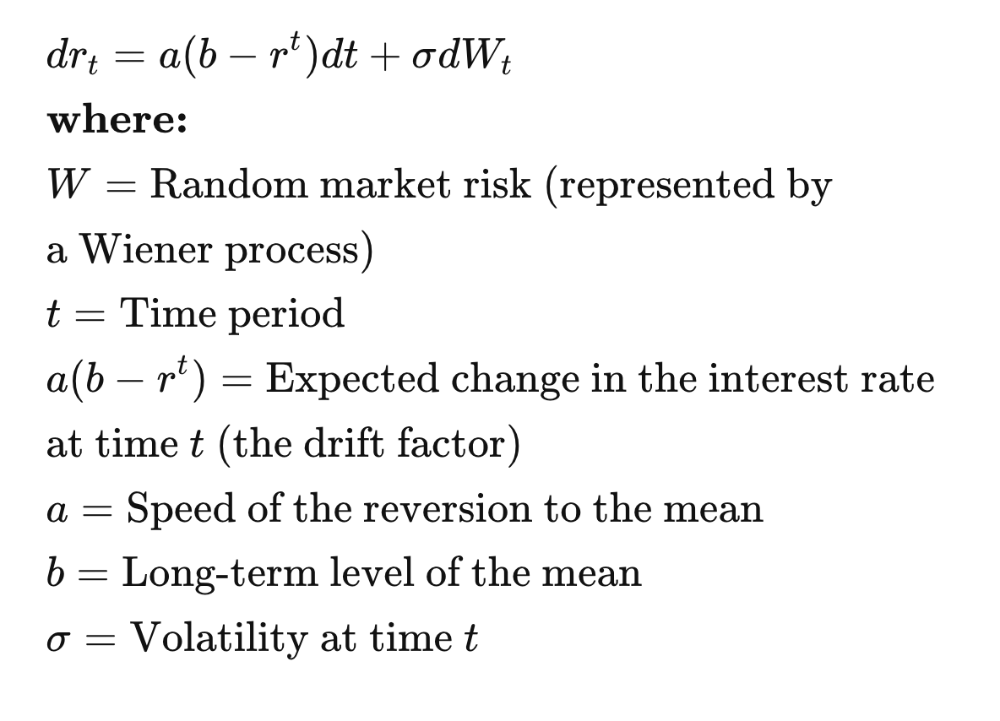

In [20]:
Image(wd + '/Vasicek Interest Rate Model Formula.png', width = 400)

In [21]:
def VasicekNextRate(r, kappa, theta, sigma, dt=1/252):
    # Implements above closed form solution     
    val1 = np.exp(-1*kappa*dt)
    val2 = (sigma**2)*(1-val1**2) / (2*kappa)
    out = r*val1 + theta*(1-val1) + (np.sqrt(val2))*np.random.normal()
    return out



def VasicekSim(N, r0, kappa, theta, sigma, dt = 1/252):
    short_r = [0]*N # Create array to store rates     short_r[0] = r0 # Initialise rates at $r_0$     
    
    for i in range(1,N):
        short_r[i] = VasicekNextRate(short_r[i-1], kappa, theta, sigma, dt)
    
    return short_r




def VasicekMultiSim(M, N, r0, kappa, theta, sigma, dt = 1/252):
    sim_arr = np.ndarray((N, M))
    
    for i in range(0,M):
        sim_arr[:, i] = VasicekSim(N, r0, kappa, theta, sigma, dt)
    
    return sim_arr



def VasicekCalibration(rates, dt=1/252):
    n = len(rates)
    
    # Implement MLE to calibrate parameters 
    Sx = sum(rates[0:(n-1)])
    Sy = sum(rates[1:n])
    Sxx = np.dot(rates[0:(n-1)], rates[0:(n-1)])
    Sxy = np.dot(rates[0:(n-1)], rates[1:n])
    Syy = np.dot(rates[1:n], rates[1:n])
    
    theta = (Sy * Sxx - Sx * Sxy) / (n * (Sxx - Sxy) - (Sx**2 - Sx*Sy))
    kappa = -np.log((Sxy - theta * Sx - theta * Sy + n * theta**2) / (Sxx - 2*theta*Sx + n*theta**2)) / dt
    a = np.exp(-kappa * dt)
    sigmah2 = (Syy - 2*a*Sxy + a**2 * Sxx - 2*theta*(1-a)*(Sy - a*Sx) + n*theta**2 * (1-a)**2) / n
    sigma = np.sqrt(sigmah2*2*kappa / (1-a**2))
    r0 = rates[n-1]
    
    return [kappa, theta, sigma, r0]

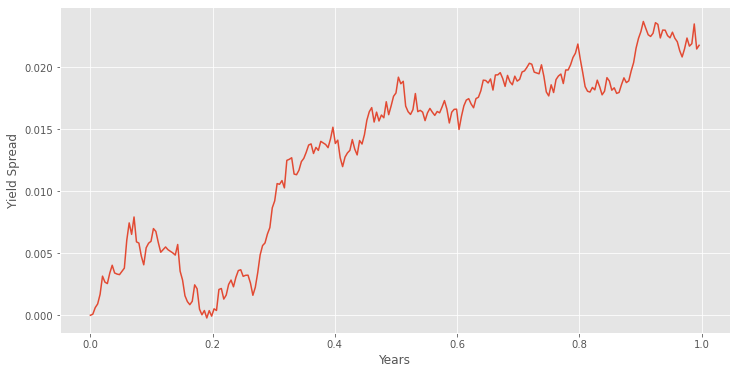

In [22]:
params = VasicekCalibration(yieldsp.loc[:, 'yieldsp'].dropna()/100)
#params = VasicekCalibration(yieldsp.dropna()/100)
kappa = params[0]
theta = params[1]
sigma = params[2]
r0 = params[3]

years = 1
N = years * 252
t = np.arange(0,N)/252

test_sim = VasicekSim(N, r0, kappa, theta, sigma, 1/252)
plt.plot(t,test_sim)
plt.ylabel("Yield Spread")
plt.xlabel("Years")
plt.show()

Simulating from r_0 = lastobservedvalue, I have generated a sequence of ex-ante trajectories of the yield spread.

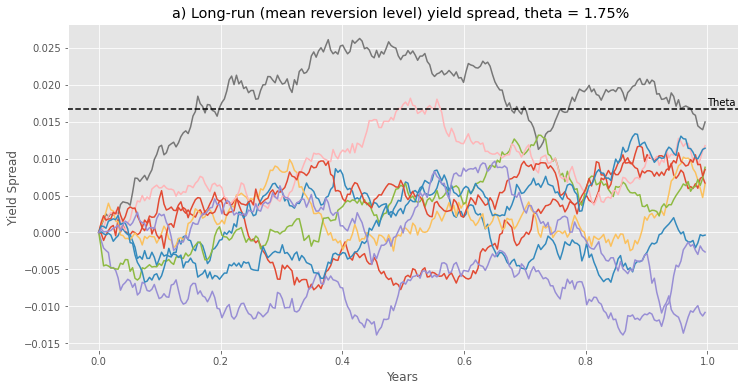

In [71]:
M = 10
rates_arr = VasicekMultiSim(M, N, r0, kappa, theta, sigma)

plt.plot(t,rates_arr)
plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
plt.annotate('Theta', xy=(1.0, theta + 0.0005))
plt.xlim(-0.05, 1.05)
plt.ylabel("Yield Spread")
plt.xlabel("Years")
plt.title("a) Long-run (mean reversion level) yield spread, theta = 1.75% ")
plt.show()


We observe the model's mean reverting nature by specifying r_0 further away from theta. Over time this pulls the yield spread towards theta, the magnitude of kappa controls the speed of the reversion. A kappa grows, mean reversion quickens. Likewise, larger sigma widens the volality and the potential distribution rate. 

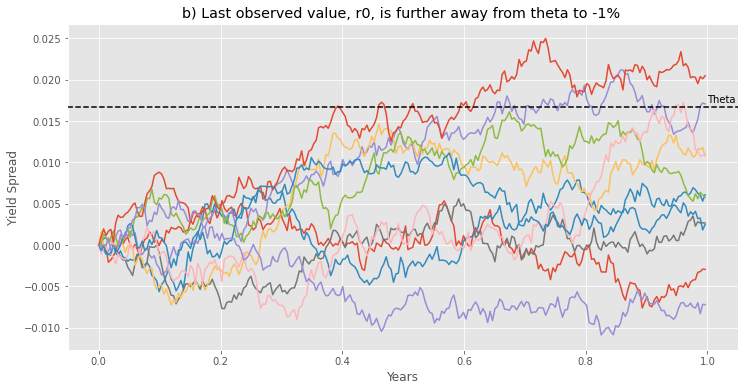

In [72]:
M = 10
rates_arr = VasicekMultiSim(M, N, -0.01, kappa, theta, sigma)
plt.plot(t,rates_arr)
plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
plt.annotate('Theta', xy=(1.0, theta+0.0005))
plt.xlim(-0.05, 1.05)
plt.ylabel("Yield Spread")
plt.xlabel("Years")
plt.title("b) Last observed value, r0, is further away from theta to -1% ")
plt.show()

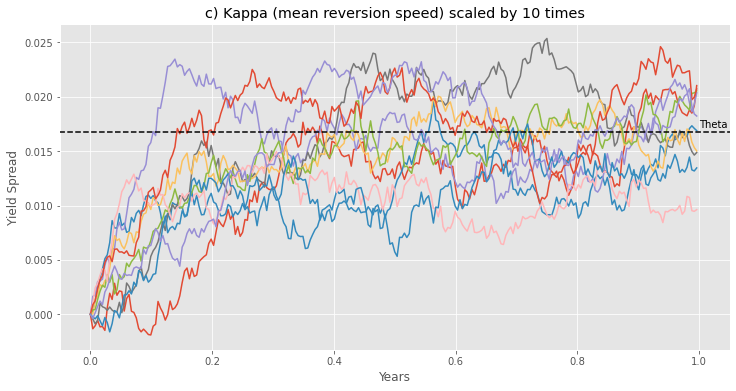

In [73]:
M = 10
rates_arr = VasicekMultiSim(M, N, -0.01, kappa*10, theta, sigma)
plt.plot(t,rates_arr)
plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
plt.annotate('Theta', xy=(1.0, theta+0.0005))
plt.xlim(-0.05, 1.05)
plt.ylabel("Yield Spread")
plt.xlabel("Years")
plt.title("c) Kappa (mean reversion speed) scaled by 10 times")
plt.show()


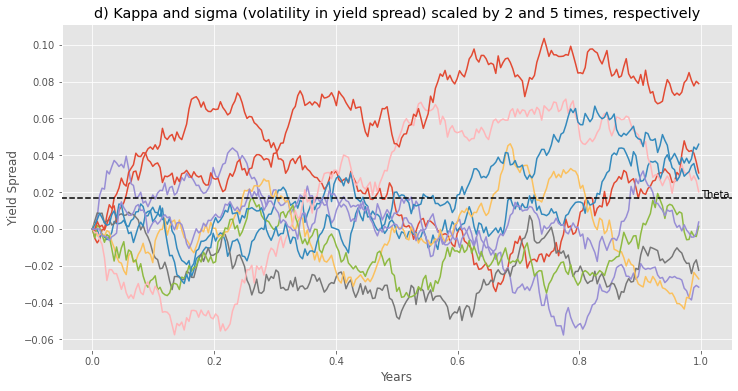

In [74]:
M = 10
rates_arr = VasicekMultiSim(M, N, -0.01, kappa*2, theta, sigma*5)
plt.plot(t,rates_arr)
plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
plt.annotate('Theta', xy=(1.0, theta+0.0005))
plt.xlim(-0.05, 1.05)
plt.ylabel("Yield Spread")
plt.xlabel("Years")
plt.title("d) Kappa and sigma (volatility in yield spread) scaled by 2 and 5 times, respectively")
plt.show()


## Check for Stationarity

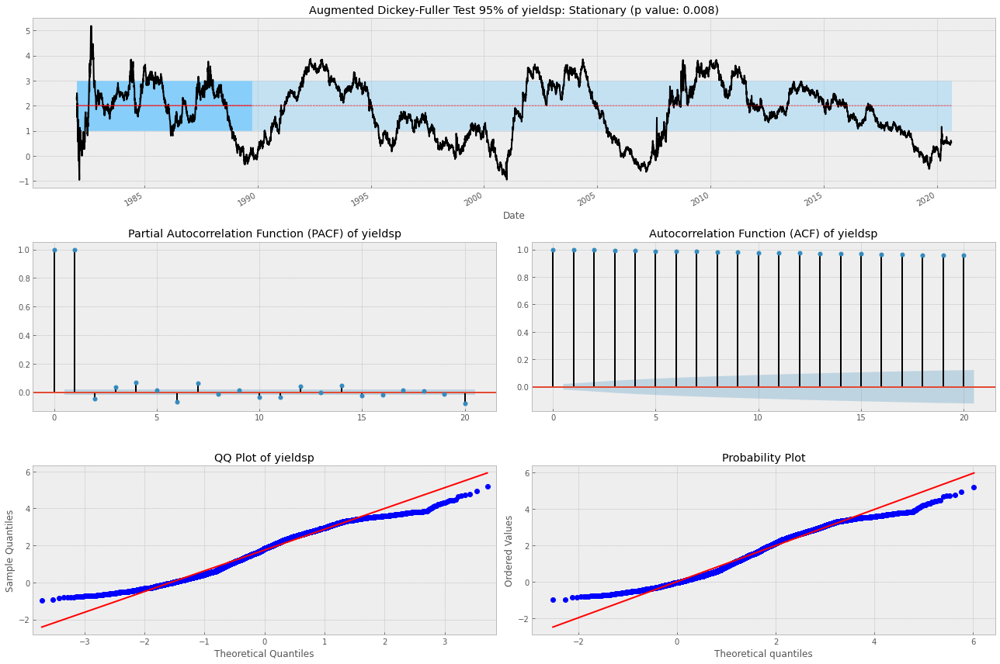

In [27]:
import statsmodels.tsa.api as smt

'''
Test stationarity by:
    - running Augmented Dickey-Fuller test wiht 95%
    - plotting mean and variance of a sample from data
    - plottig autocorrelation and partial autocorrelation
'''
def test_stationarity_acf_pacf(ts, sample=0.20, maxlag=30, figsize= 
                              (18,12)):
    with plt.style.context(style='bmh'):
        ## set figure
        fig = plt.figure(figsize=figsize)
        layout = (3, 2)
        ts_ax = plt.subplot2grid(layout, loc=(0,0), colspan=2)
        pacf_ax = plt.subplot2grid(layout, loc=(1,0))
        acf_ax = plt.subplot2grid(layout, loc=(1,1))
        qq_ax = plt.subplot2grid(layout, loc=(2, 0))
        pp_ax = plt.subplot2grid(layout, loc=(2, 1))
        
        ## plot ts with mean/std of a sample from the first x% 
        dtf_ts = ts.to_frame(name="ts")
        sample_size = int(len(ts)*sample)
        dtf_ts["mean"] = dtf_ts["ts"].head(sample_size).mean()
        dtf_ts["lower"] = dtf_ts["ts"].head(sample_size).mean() + dtf_ts["ts"].head(sample_size).std()
        dtf_ts["upper"] = dtf_ts["ts"].head(sample_size).mean()  - dtf_ts["ts"].head(sample_size).std()
        dtf_ts["ts"].plot(ax=ts_ax, color="black", legend=False)
        dtf_ts["mean"].plot(ax=ts_ax, legend=False, color="red",
                            linestyle="--", linewidth=0.7)
        ts_ax.fill_between(x=dtf_ts.index, y1=dtf_ts['lower'], 
                y2=dtf_ts['upper'], color='lightskyblue', alpha=0.4)
        dtf_ts["mean"].head(sample_size).plot(ax=ts_ax,
                legend=False, color="red", linewidth=0.9)
        ts_ax.fill_between(x=dtf_ts.head(sample_size).index, 
                           y1=dtf_ts['lower'].head(sample_size), 
                           y2=dtf_ts['upper'].head(sample_size),
                           color='lightskyblue')
        
        ## test stationarity (Augmented Dickey-Fuller)
        adfuller_test = sm.tsa.stattools.adfuller(ts, maxlag=maxlag,
                                                  autolag="AIC")
        adf, p, critical_value = adfuller_test[0], adfuller_test[1], adfuller_test[4]["5%"]
        p = round(p, 3)
        conclusion = " Stationary" if p < 0.05 else " Non-Stationary"
        ts_ax.set_title('Augmented Dickey-Fuller Test 95% of '+ variable + ':' + conclusion +
                        ' (p value: '+str(p)+')')
        
        ## pacf (for MA) e acf (for AR) 
        smt.graphics.plot_pacf(ts, lags=maxlag, ax = pacf_ax, 
                 title="Partial Autocorrelation Function (PACF) of " + variable)
        smt.graphics.plot_acf(ts, lags=maxlag, ax=acf_ax,
                 title="Autocorrelation Function (ACF) of "+ variable)
        sm.qqplot(ts, line='s', ax=qq_ax)
        qq_ax.set_title('QQ Plot of ' + variable)        
        scs.probplot(ts, sparams=(ts.mean(), ts.std()), plot=pp_ax)

        plt.tight_layout()    
        
for variable in yieldsp.columns:
    test_stationarity_acf_pacf(yieldsp[variable], sample=0.20, maxlag=20)                               

The ACF plot shows a strong autocorrelation of lags as spikes very gradually reduce. The partial autocorrelation (PAC) measures the correlation between yt and yt−n after we control for correlations at intermediate lags. So, when we regress y_t against a constant, y_(t-1),..., y_(t-n), the PACF at lag n is the regression coefficient on y_(t-n).

The PACF shows a significant lag for perhaps 3 days, with significant lags spotty out to perhaps 20 days. We can try MA(4).

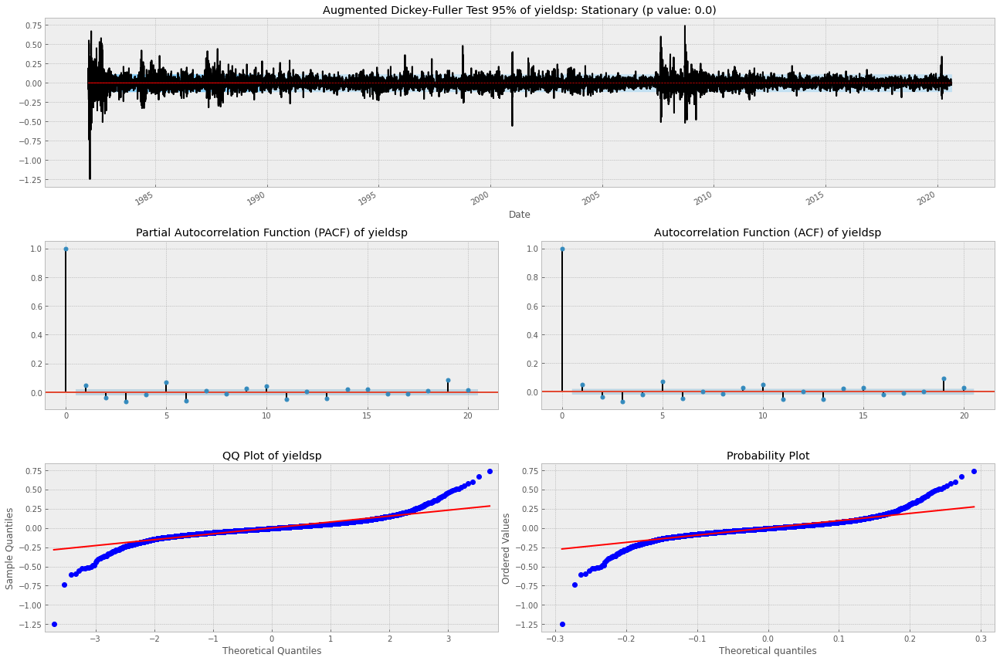

In [28]:
# Since the partial data on yield spread has unit root, => stationarize it by differencing. 
diff = yieldsp['yieldsp'].diff().to_frame()

# drops rows with NaN values, and replaces inf values with 0
yield_diff = diff.dropna(inplace = False).replace([np.inf, -np.inf], 0).dropna(axis=1)

#adfuller_test(yield_diff['yieldsp'], signif = 0.05, name = 'Yield Spread', verbose = False)
#test_stationarity_acf_pacf(yield_diff['yieldsp'], sample=0.20, maxlag=30)

for variable in yield_diff.columns:
    test_stationarity_acf_pacf(yield_diff[variable], sample=0.20, maxlag=20)

From the ACF and PACF plots of the differenced yield curve, we can try AR(3) and MA(3).

## ARIMA Models

### ARIMA with leveled yield spread

A time series rests on the foundational assumption that the disturbance or the error term is a white noise process. Thus, firstly we cannot use the last day's error term to forecast the current error term. Secondly, the error has a constant variance i.e. homoskedastic. Thirdly, the errors are serially uncorrelation. 

Alternatively, moving average (MA) models are extended versions of the a white noise series. Here, a MA linear model composes of a linear regression of a current value of the yield spread agaianst the unobserved while noise shocks of the current and past days. 

In [29]:
X = yieldsp.values
size = int(len(X) * 0.95)
train, test = X[0:size], X[size:len(X)]

# fit model in the whole dataset
model = ARIMA(train, order=(1,0,3))
    
# disp = 0: turns off the debug info about the fit of the ARIMA model
model_fit_arima = model.fit(disp=0)
print(model_fit_arima.summary())

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                 9179
Model:                     ARMA(1, 3)   Log Likelihood               10482.017
Method:                       css-mle   S.D. of innovations              0.077
Date:                Sun, 30 Aug 2020   AIC                         -20952.034
Time:                        18:29:42   BIC                         -20909.286
Sample:                             0   HQIC                        -20937.503
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.8092      0.318      5.695      0.000       1.187       2.432
ar.L1.y        0.9977      0.001   1442.175      0.000       0.996       0.999
ma.L1.y        0.0440      0.010      4.225      0.0

In [33]:
# plot residual errors
resid_arima = DataFrame(model_fit_arima.resid, columns = ['resid_arima'])
fig_res = resid_arima.iplot(asFigure=True, kind='scatter', xTitle='Index', yTitle='Residuals')


fig_res.update_layout(
    title={
        'text': "Residuals from ARIMA(1,0,3)",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_res.show()

In [31]:
# displayed a histogram, a kde plot and a rug plot
hist_data = [resid_arima['resid_arima']]
group_labels = ['distplot'] # name of the dataset

fig_kde = ff.create_distplot(hist_data, group_labels, bin_size=0.25)
fig_kde.update_layout(
    title={
        'text': "Histogram, KDE and a Rug Plot of Residuls from ARIMA(1,0,3)",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_kde.show()

In [32]:
print(resid_arima.describe())

       resid_arima
count  9179.000000
mean     -0.000062
std       0.077401
min      -1.214818
25%      -0.037733
50%      -0.001396
75%       0.036517
max       0.753138


The plots shows the kernel density estimate (KDE) of the standardized residuals, which suggests the errors are Gaussian with a mean centered at approximately zero *(0.000002)*, indicating no bias in the predictions. If the mean is non-zero, then the prediction may be biased positively. The line plot of residuals suggest that the model captures of the trend information. 

Next, I have evaluated the ARIMA model using a walk-forward validation scheme. Here, the model predicts for the next day (time *t+1*), and then inputs the actual value of the yield spread for the next day (at time *t+1*) to forecast the yield spread for the subsequent day (time *t+2*) and so on. 

In [124]:
# fit the model on the train set and generate prediction for each element on the test set.
# perform a rolling forecast : re-create the ARIMA forecast when each new observation is received. 
# forecast(): performs a one-step forecast from the model
# history - list created to track all the observations seeded with the training set
# => after each iteration, all new observations are appended to the list "history",


X = yieldsp.values
size = int(len(X) * 0.95)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()

# walk-forward validation
for t in range(len(test)):
    model = ARIMA(history, order=(1,0,3))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
        

predicted=0.821146, expected=0.830000
predicted=0.833872, expected=0.830000
predicted=0.831293, expected=0.880000
predicted=0.883766, expected=0.920000
predicted=0.922890, expected=0.900000
predicted=0.896941, expected=0.890000
predicted=0.889802, expected=0.860000
predicted=0.862630, expected=0.890000
predicted=0.894461, expected=0.860000
predicted=0.862171, expected=0.880000
predicted=0.881772, expected=0.860000
predicted=0.863258, expected=0.860000
predicted=0.861279, expected=0.820000
predicted=0.822055, expected=0.920000
predicted=0.927475, expected=0.970000
predicted=0.974604, expected=1.000000
predicted=0.995275, expected=0.960000
predicted=0.956921, expected=0.950000
predicted=0.950682, expected=0.870000
predicted=0.871239, expected=0.870000
predicted=0.874326, expected=0.850000
predicted=0.856807, expected=0.860000
predicted=0.862939, expected=0.880000
predicted=0.884531, expected=0.850000
predicted=0.850110, expected=0.890000
predicted=0.893425, expected=0.860000
predicted=0.

predicted=-0.017804, expected=-0.040000
predicted=-0.032366, expected=-0.060000
predicted=-0.058894, expected=-0.020000
predicted=-0.012482, expected=-0.060000
predicted=-0.057110, expected=-0.170000
predicted=-0.172590, expected=-0.200000
predicted=-0.191512, expected=-0.300000
predicted=-0.292065, expected=-0.320000
predicted=-0.312857, expected=-0.310000
predicted=-0.297556, expected=-0.300000
predicted=-0.294021, expected=-0.260000
predicted=-0.254544, expected=-0.350000
predicted=-0.350355, expected=-0.320000
predicted=-0.314888, expected=-0.370000
predicted=-0.362038, expected=-0.390000
predicted=-0.387857, expected=-0.320000
predicted=-0.308465, expected=-0.340000
predicted=-0.336538, expected=-0.390000
predicted=-0.392027, expected=-0.380000
predicted=-0.371892, expected=-0.380000
predicted=-0.372576, expected=-0.450000
predicted=-0.449573, expected=-0.470000
predicted=-0.464285, expected=-0.490000
predicted=-0.480848, expected=-0.520000
predicted=-0.515224, expected=-0.490000


predicted=0.535703, expected=0.610000
predicted=0.615016, expected=0.670000
predicted=0.672633, expected=0.760000
predicted=0.759709, expected=0.710000
predicted=0.704275, expected=0.650000
predicted=0.644922, expected=0.580000
predicted=0.584180, expected=0.490000
predicted=0.493572, expected=0.550000
predicted=0.561613, expected=0.530000
predicted=0.536453, expected=0.580000
predicted=0.581183, expected=0.570000
predicted=0.573235, expected=0.550000
predicted=0.548696, expected=0.550000
predicted=0.553859, expected=0.550000
predicted=0.553933, expected=0.560000
predicted=0.562765, expected=0.540000
predicted=0.541653, expected=0.520000
predicted=0.521676, expected=0.500000
predicted=0.503692, expected=0.500000
predicted=0.504421, expected=0.500000
predicted=0.504000, expected=0.550000
predicted=0.554933, expected=0.540000
predicted=0.541176, expected=0.540000
predicted=0.539608, expected=0.500000
predicted=0.501897, expected=0.520000
predicted=0.524322, expected=0.490000
predicted=0.

In [125]:
pred = pd.DataFrame(predictions, columns = ['pred'])
#pred.shape
#yieldsp.iloc[-len(test):,] #=> finds the 358th row from the bottom

In [137]:
pred.index = pd.date_range(start="2019-04-26",end="2020-08-21" )
test = pd.DataFrame(test, columns = ['test_yieldsp'])

test.index = pd.date_range(start="2019-04-26",end="2020-08-21")

# combine the predictions from leveled ARIMA with the test values
merge = pd.merge(pred, test, how='inner', left_index=True, right_index=True)
merge.tail()

,pred,test_yieldsp
2020-08-17,0.608589,0.59
2020-08-18,0.589692,0.58
2020-08-19,0.582359,0.57
2020-08-20,0.573407,0.54
2020-08-21,0.541958,0.54


In [139]:
error = sqrt(mean_squared_error(merge['test_yieldsp'], merge['pred']))
print('Test RMSE from the leveled model - ARIMA(1,0,3): %.5f' % error)

Test RMSE from the leveled model - ARIMA(1,0,3): 0.05185


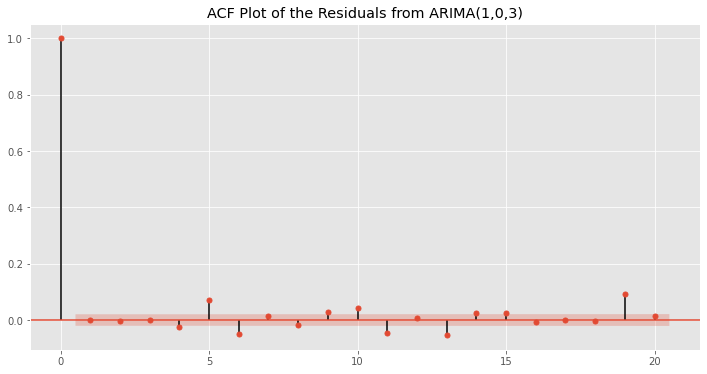

In [140]:
# makes the ACF plot of the differenced yield curve
plot_acf(resid_arima, lags = 20, 
          title = 'ACF Plot of the Residuals from ARIMA(1,0,3)')

pyplot.show()

In [141]:
X = yieldsp.values

# multi-step out-of-sample forecast
start_index = len(yieldsp)
end_index = start_index + 6

forecast = model_fit.predict(start=start_index, end=end_index)

# invert the differenced forecast to something usable
history = [x for x in X]

day = date(2020,8,22)

for yhat in forecast:
    print('{}: {}'.format(day, yhat))
    history.append(forecast)
    day += timedelta(days=1)

2020-08-22: 0.5419577224078017
2020-08-23: 0.5460505123245079
2020-08-24: 0.5508792583579175
2020-08-25: 0.5533732189952485
2020-08-26: 0.5558618822996854
2020-08-27: 0.5583452595231041
2020-08-28: 0.5608233618934809
2020-08-29: 0.5632962006149431


### ARIMA with differenced yield spread

In [34]:
X_diff = yield_diff.values
size = int(len(X_diff) * 0.95)
train_diff, test_diff = X_diff[0:size], X_diff[size:len(X_diff)]
history = [x for x in train_diff]
predictions = list()

# fit model
model_diff = ARIMA(train_diff, order=(3,1,3))
mod_fit_diff = model_diff.fit(disp=0)
print(mod_fit_diff.summary())

/Users/joshi27s/opt/anaconda3/envs/tsa_course/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                 9177
Model:                 ARIMA(3, 1, 3)   Log Likelihood               10466.856
Method:                       css-mle   S.D. of innovations              0.077
Date:                Sun, 30 Aug 2020   AIC                         -20917.711
Time:                        18:35:25   BIC                         -20860.716
Sample:                             1   HQIC                        -20898.336
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -3.341e-08   2.96e-07     -0.113      0.910   -6.14e-07    5.47e-07
ar.L1.D.y      0.2196      0.005     45.384      0.000       0.210       0.229
ar.L2.D.y      0.1522      0.068      2.227      0.0

In [35]:
# plot residual errors
resid_diff = DataFrame(mod_fit_diff.resid, columns = ['resid_diff'])
fig_res = resid_diff.iplot(asFigure=True, kind='scatter', xTitle='Index', yTitle='Residuals')
fig_res.update_layout(
    title={
        'text': "Residuals from Differenced ARIMA(3,1,3)",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_res.show()

In [36]:
# displayed a histogram, a kde plot and a rug plot
hist_data = [resid_diff['resid_diff']]
group_labels = ['distplot'] # name of the dataset

fig_kde = ff.create_distplot(hist_data, group_labels, bin_size=0.25)
fig_kde.update_layout(
    title={
        'text': "Histogram, KDE and a Rug Plot of Residuls from Differenced ARIMA(3,1,3)",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_kde.show()

In [154]:
print(resid_diff.describe())

        resid_diff
count  9177.000000
mean      0.000516
std       0.077679
min      -1.138348
25%      -0.037764
50%      -0.000814
75%       0.037145
max       0.751493


In [156]:
# fit the model on the train set and generate prediction for each element on the test set.
# perform a rolling forecast : re-create the ARIMA forecast when each new observation is received. 
# forecast(): performs a one-step forecast from the model
# history - list created to track all the observations seeded with the training set
# => after each iteration, all new observations are appended to the list "history",


X = yieldsp['yieldsp'].values
size = int(len(X) * 0.95)
train_diff, test_diff = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions_diff = list()
gap = 1

# create a differenced series
def difference(dataset, interval=1):
	diff = list()
	for i in range(interval, len(dataset)):
		value = dataset[i] - dataset[i - interval]
		diff.append(value)
	return np.array(diff)

diff = difference(X, 1)


# invert differenced value
def invert_diff(history, yhat, interval=1):
    return yhat + history[-interval]

# walk-forward validation
for t in range(len(test)):
    model_diff = ARIMA(diff, order=(3,1,3))
    model_diff_fit = model_diff.fit(disp=0)
    output = model_diff_fit.forecast()
    yhat = output[0]
    inverted = invert_diff(history, yhat, gap)
    predictions_diff.append(inverted)
    obs = test_diff[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (inverted, obs))

predicted=0.820247, expected=0.830000
predicted=0.830247, expected=0.830000
predicted=0.830247, expected=0.880000
predicted=0.880247, expected=0.920000
predicted=0.920247, expected=0.900000
predicted=0.900247, expected=0.890000
predicted=0.890247, expected=0.860000
predicted=0.860247, expected=0.890000
predicted=0.890247, expected=0.860000
predicted=0.860247, expected=0.880000
predicted=0.880247, expected=0.860000
predicted=0.860247, expected=0.860000
predicted=0.860247, expected=0.820000
predicted=0.820247, expected=0.920000
predicted=0.920247, expected=0.970000
predicted=0.970247, expected=1.000000
predicted=1.000247, expected=0.960000
predicted=0.960247, expected=0.950000
predicted=0.950247, expected=0.870000
predicted=0.870247, expected=0.870000
predicted=0.870247, expected=0.850000
predicted=0.850247, expected=0.860000
predicted=0.860247, expected=0.880000
predicted=0.880247, expected=0.850000
predicted=0.850247, expected=0.890000
predicted=0.890247, expected=0.860000
predicted=0.

predicted=-0.019753, expected=-0.040000
predicted=-0.039753, expected=-0.060000
predicted=-0.059753, expected=-0.020000
predicted=-0.019753, expected=-0.060000
predicted=-0.059753, expected=-0.170000
predicted=-0.169753, expected=-0.200000
predicted=-0.199753, expected=-0.300000
predicted=-0.299753, expected=-0.320000
predicted=-0.319753, expected=-0.310000
predicted=-0.309753, expected=-0.300000
predicted=-0.299753, expected=-0.260000
predicted=-0.259753, expected=-0.350000
predicted=-0.349753, expected=-0.320000
predicted=-0.319753, expected=-0.370000
predicted=-0.369753, expected=-0.390000
predicted=-0.389753, expected=-0.320000
predicted=-0.319753, expected=-0.340000
predicted=-0.339753, expected=-0.390000
predicted=-0.389753, expected=-0.380000
predicted=-0.379753, expected=-0.380000
predicted=-0.379753, expected=-0.450000
predicted=-0.449753, expected=-0.470000
predicted=-0.469753, expected=-0.490000
predicted=-0.489753, expected=-0.520000
predicted=-0.519753, expected=-0.490000


predicted=0.530247, expected=0.610000
predicted=0.610247, expected=0.670000
predicted=0.670247, expected=0.760000
predicted=0.760247, expected=0.710000
predicted=0.710247, expected=0.650000
predicted=0.650247, expected=0.580000
predicted=0.580247, expected=0.490000
predicted=0.490247, expected=0.550000
predicted=0.550247, expected=0.530000
predicted=0.530247, expected=0.580000
predicted=0.580247, expected=0.570000
predicted=0.570247, expected=0.550000
predicted=0.550247, expected=0.550000
predicted=0.550247, expected=0.550000
predicted=0.550247, expected=0.560000
predicted=0.560247, expected=0.540000
predicted=0.540247, expected=0.520000
predicted=0.520247, expected=0.500000
predicted=0.500247, expected=0.500000
predicted=0.500247, expected=0.500000
predicted=0.500247, expected=0.550000
predicted=0.550247, expected=0.540000
predicted=0.540247, expected=0.540000
predicted=0.540247, expected=0.500000
predicted=0.500247, expected=0.520000
predicted=0.520247, expected=0.490000
predicted=0.

In [157]:
pred_inv = pd.DataFrame(predictions_diff, columns = ['pred_diff'])
pred_inv.index = pd.date_range(start="2019-04-26",end="2020-08-21" )
merge_inv = pd.merge(pred_inv, merge, how='inner', left_index=True, right_index=True)
merge_inv.tail()

,pred_diff,pred,test_yieldsp
2020-08-17,0.610247,0.608589,0.59
2020-08-18,0.590247,0.589692,0.58
2020-08-19,0.580247,0.582359,0.57
2020-08-20,0.570247,0.573407,0.54
2020-08-21,0.540247,0.541958,0.54


In [159]:
# calculate RMSE
rmse = sqrt(mean_squared_error(merge_inv['test_yieldsp'], merge_inv['pred_diff']))
print('Test RMSE from the differenced model - ARIMA(3,1,3): %.5f' % rmse)

Test RMSE from the differenced model - ARIMA(3,1,3): 0.05203


In [160]:
# line plot shows that compares the actual yieldsp with rolling forecast predictions from leveled and diff ARIMA
fig_arima_diff = merge_inv.iplot(asFigure=True, kind='scatter', xTitle='Date', 
                                 yTitle='Predicted and Actual Yield Spread')
fig_arima_diff.update_layout(
    title={
        'text': "Actual and Forecasted Yield Spread from ARIMA(1,0,3) and ARIMA(3,1,3)",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig_arima_diff.show()

In [161]:
X = yieldsp['yieldsp'].values


# multi-step out-of-sample forecast
start_index = len(yield_diff)
end_index = start_index + 6

forecast = model_diff_fit.predict(start=start_index, end=end_index)

# invert the differenced operation by adding the value of the observation one day ago. 
# => do this to any forecasts made by a model trained on the differenced data.

def invert_diff(history, yhat, interval=1):
    return yhat + history[-interval]


# invert the differenced forecast to something usable
history = [x for x in X]
day = date(2020,8,22)
gap = 1

for yhat in forecast:
    inverted = invert_diff(history, yhat, gap)
    print('{}: {}'.format(day, inverted))
    history.append(inverted)
    day += timedelta(days=1)

2020-08-22: 0.5402472166085871
2020-08-23: 0.5400240413968203
2020-08-24: 0.5389265018405347
2020-08-25: 0.5394348784191845
2020-08-26: 0.5401884056303865
2020-08-27: 0.5395510812626344
2020-08-28: 0.5391175771313805


## ARCH and GARCH Models


In economics and finance, a change in variance in one time may change the variance in the same direction in the subsequent time, as observed in the yield spread data. For instance, a drop in yield spread when recession is imminent worries investors about deteriorating economic and financial conditions, leading to further drop in yield spread. This is because the yield on long term treasuries plummet, shrinking the gap between short and long term yields, insofar as the yields can be negative when short term yields surpass the long term yields, signalling a contractionary economy.


If the variance of the the yield spread represents the riskiness of the spread, then certain time periods are riskier than others; connoting that magnitude of error in certain times is greater than in other times. Heightened riskiness depicts volatility clustering. 

Moreover, as these risky times are not randomly scarrered across the daily time series, a degree of autocorrelation is present in the yield spread. This downward trajectory of volatility is evidence of heteroskedasticity where errors are serially correlated. Thus, the series of errors is conditionally heteroskedastic. 

Even in heteroskedasticity,the OLS regression coefficients are unbiased, but the confidence intervals and standard errors generated conventionally appear very narrow, giving a misleading sense of precision. Rather than considering this as a problem to be resolved, we use (G)ARCH models, that treat heteroskedasticity by modeling the variance. Resultantly, it not only resolves the defects of OLS, but also forecasts the variance of residual.

 

The tricky aspect of conditional heteroskedasticity is that the ACF plots of a very volatile series may misleadingly appear to be a stationary discrete noise process, albeit the series actually has unit root with varying variance. To accomodate this conditional heteroskedasticity, we construct ARCH models as they ential autoregressive parameters of the variance - incorporating past changes in variances. 

Useful for forecasting volatility, ARCH models the change in variance over a time period as a function of the residual errors from a mean process. These models explicitely differentiate between conditional and unconditional variance, and let the former change as a function of historical errors. We specify a lag parameter $q$ to state the number of historical (or lagged) residual errors that we incorporate in the model. 

(G)ARCH are applied to stationary series - devoid of seasonal and trend components, but can have non-constant variance. These models project the ex-ante variance for a given time horizon. ARCH has a mean of 0, uncorrelated processes with heteroskedasticity conditional on the lagged values, but constant unconditional variances. 
Empirically, after constructing (S)ARIMA, we can use (G)ARCH to model the expected variance on the residuals, provided that the residuals are not serially correlated and don't have any trend and seasonal patterns. 

An extention of ARCH, GARCH encompasses an MA component alongside the usual AR component from ARCH to model not only the conditional change in variance but also adjustments in the time-dependent variance over time. For instance: conditional rise and fall in variance. Also, it includes the lagged variance terms and lag residual errors derived from a mean process. The parameter $p$ in GARCH refers to the number of lag variance terms, whereas $q$ refers to the 
number of lag residual errors included in the GARCH model. This culminates to GARCH(p, q).

Subsuming ARCH models, GARCH(0, q) is equivalent to an ARCH(q) model. Hence, p = 0, implies an ARCH(q) process. If both p = q = 0, then the series is a white noise. 

### When To Apply ARCH(p)?

When fitting an AR(p), we observe the decay of the $p$ lag displayed in the ACF plot of the residuals and the squared residuals. To apply ARCH we need to ensure that the mean of the residuals = 0. 

In [173]:
# from the residuals of ARIMA(1,0,3), derive the squared residuals
resid_arima['resid_arima_squared'] = resid_arima['resid_arima']**2 
resid_arima.head()

,resid_arima,resid_arima_squared
0,0.510793,0.260909
1,-0.078691,0.006192
2,0.194715,0.037914
3,0.020873,0.000436
4,0.039314,0.001546


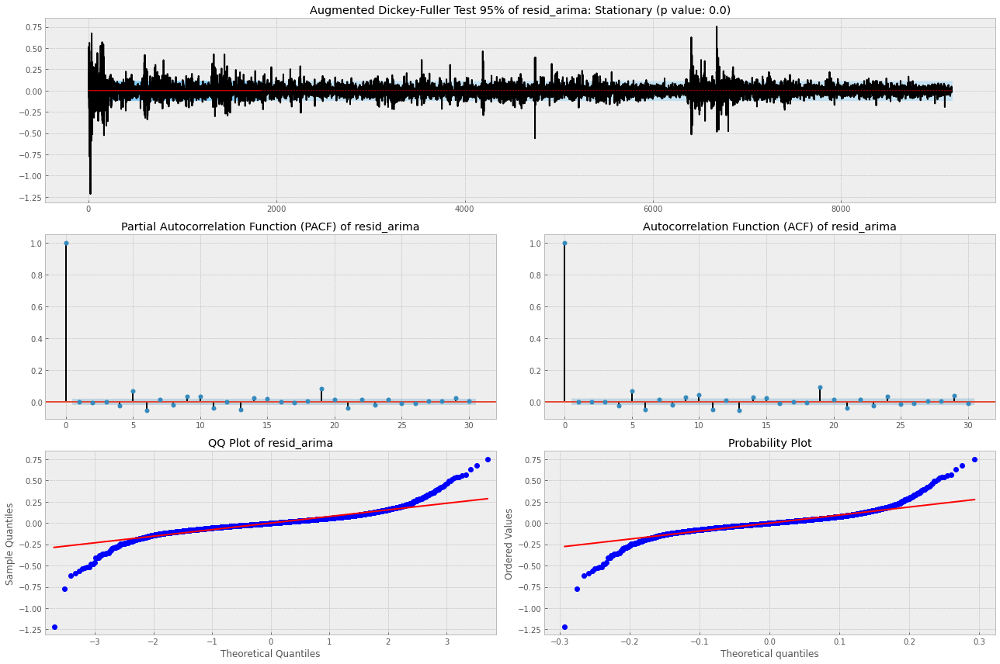

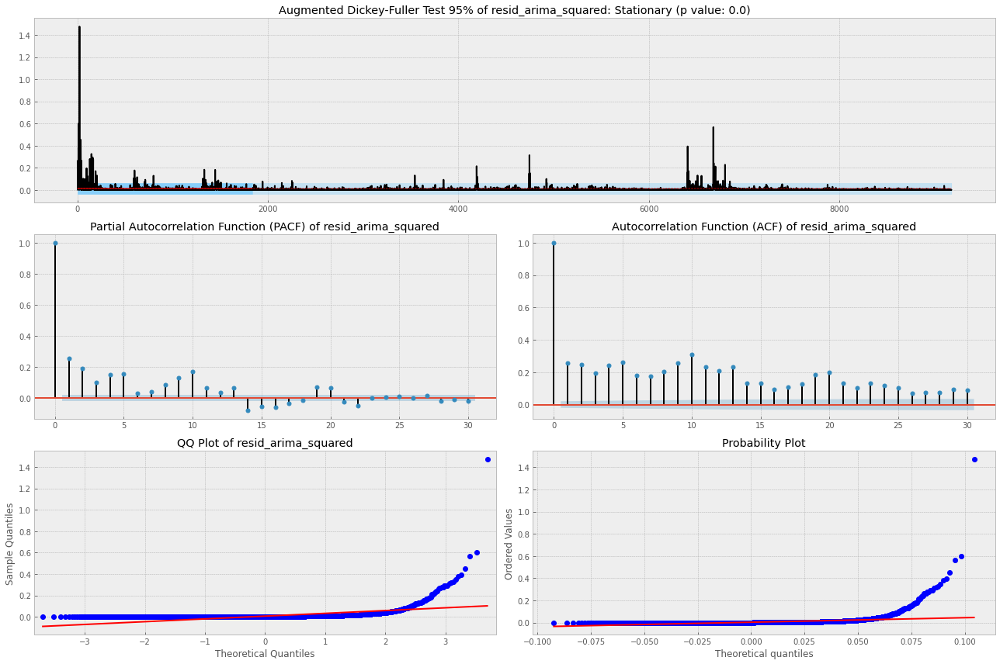

In [179]:
for variable in resid_arima.columns:
    test_stationarity_acf_pacf(resid_arima[variable], sample=0.20, maxlag=30)                   

Whilst the residuals from ARIMA(1,0,3) appear to be white noise process, the squared residuals are highly autocorrelated. The slow decay of successive lags indicate conditional heteroskedasticity. Given that the lags in both the PACF and ACF plots are significant, the model would be better fit with both AR and MA parameters. So, I have fit a GARCH(1,3) model and checked how the residuals from GARCH(1,3) behave. 

In [181]:
# Now we can fit the arch model using the best fit arima model parameters
# Using the student-T distribution usually provides better fit
ar = arch_model(resid_arima['resid_arima'], p=1, o=0, q=3, power=1.0)
res = ar.fit(update_freq=5)
print(res.summary())

Iteration:      5,   Func. Count:     52,   Neg. LLF: -12117.810760238524
Iteration:     10,   Func. Count:     93,   Neg. LLF: -11295.795057628164
Iteration:     15,   Func. Count:    129,   Neg. LLF: -12339.276253747936
Optimization terminated successfully    (Exit mode 0)
            Current function value: -12339.27625597213
            Iterations: 17
            Function evaluations: 142
            Gradient evaluations: 17
                    Constant Mean - AVGARCH Model Results                     
Dep. Variable:            resid_arima   R-squared:                      -0.001
Mean Model:             Constant Mean   Adj. R-squared:                 -0.001
Vol Model:                    AVGARCH   Log-Likelihood:                12339.3
Distribution:                  Normal   AIC:                          -24666.6
Method:            Maximum Likelihood   BIC:                          -24623.8
                                        No. Observations:                 9179
Date:         

We can see that the true parameters: mu, alpha and beta2,3, fall within the respective confidence intervals.

In [176]:
resid_garch = pd.DataFrame(res.resid).rename(columns = {'resid': 'resid_garch'})
resid_garch['resid_garch_sq'] = resid_garch['resid_garch']**2
resid_garch.head()

,resid_garch,resid_garch_sq
0,0.512795,0.262959
1,-0.076689,0.005881
2,0.196717,0.038698
3,0.022876,0.000523
4,0.041316,0.001707


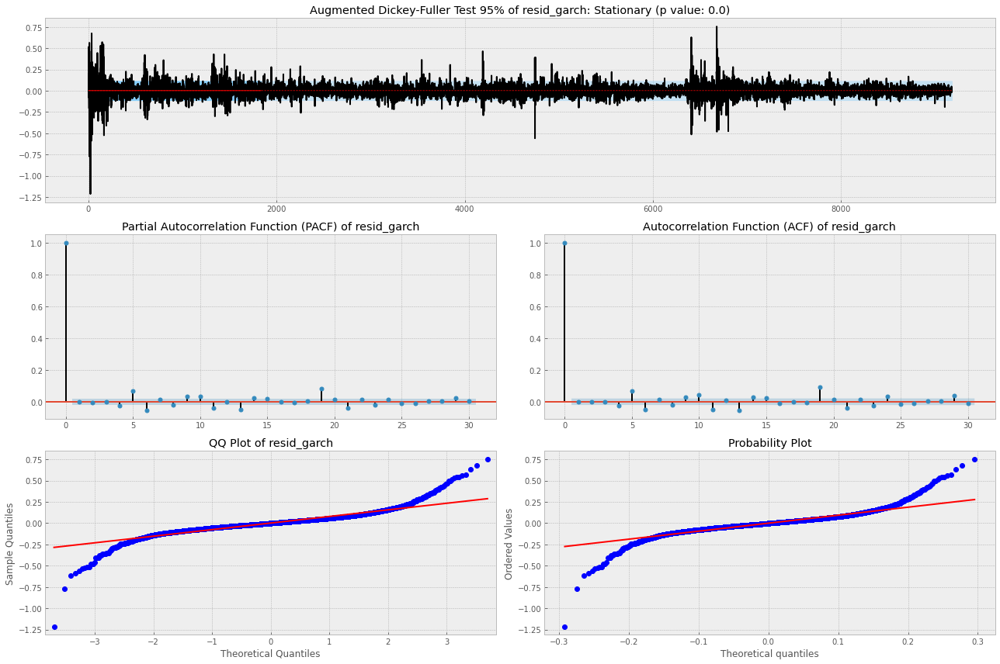

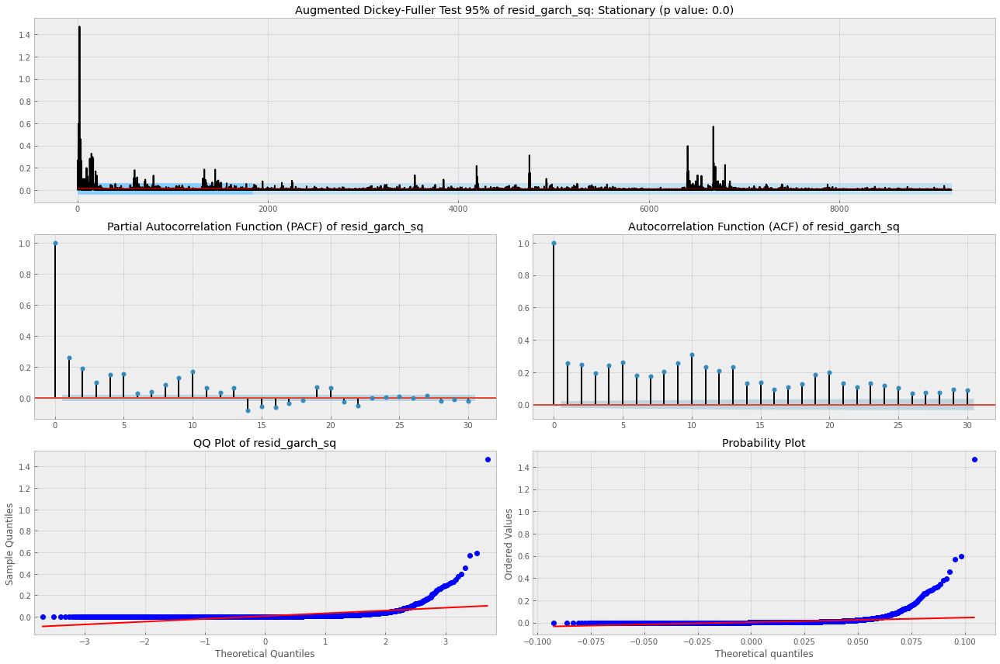

In [180]:
for variable in resid_garch.columns:
    test_stationarity_acf_pacf(resid_garch[variable], sample=0.20, maxlag=30) 

While the residuls (from GARCH) plot looks like a realisation of a discrete white noise process, indicating a good fit, the squared residuals are still not white noise. So, GARCH(1,4) has not "explained" the serial correlation present in the squared residuals with an appropriate mixture of ARIMA(p,d,q) and GARCH(p,q).

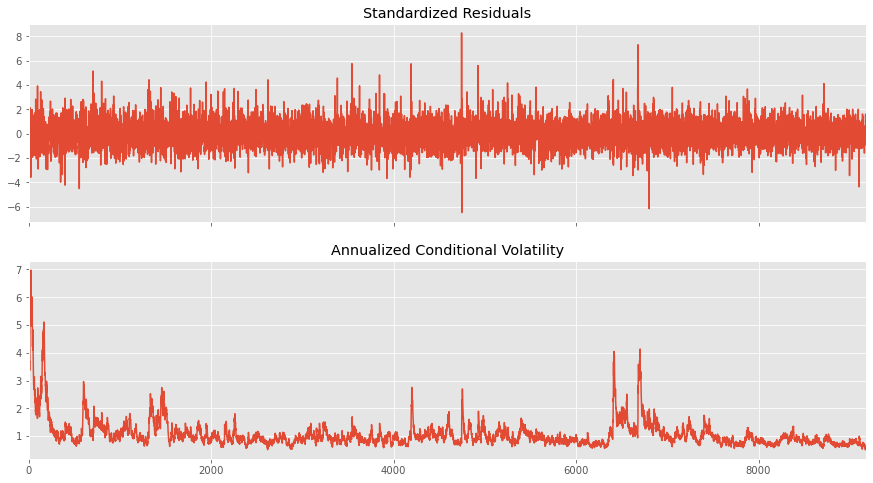

In [178]:
# Plot standardized residuals and conditional volatility
from pylab import rcParams
rcParams['figure.figsize'] = 15,8
fig = res.plot(annualize='D')

## References:

https://www.gid.works/2018/10/09/3d-yield-curve.html - 3D graph of the yield curve

https://clinthoward.github.io/portfolio/2017/08/19/Rates-Simulations/ - PCA and Vasicek model simulations

https://sebastianraschka.com/Articles/2015_pca_in_3_steps.html - PCA explained

https://online.stat.psu.edu/stat505/book/export/html/670 - well explanation on PCA eigenvalues and vectors formulas

https://machinelearningmastery.com/arima-for-time-series-forecasting-with-python/ - ARIMA models

https://machinelearningmastery.com/make-sample-forecasts-arima-python/ - Out of sample forecasting

https://machinelearningmastery.com/time-series-forecasting-methods-in-python-cheat-sheet/ - Classical models including ARIMAX, VARMAX

https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/

https://towardsdatascience.com/energy-consumption-time-series-forecasting-with-python-and-lstm-deep-learning-model-7952e2f9a796 - LSTM

https://machinelearningmastery.com/multivariate-time-series-forecasting-lstms-keras/ - LSTM with exog variables

https://machinelearningmastery.com/understanding-stateful-lstm-recurrent-neural-networks-python-keras/ - stateful and stateless LSTM

https://machinelearningmastery.com/exploratory-configuration-multilayer-perceptron-network-time-series-forecasting/
-Multilayer Perceptron 

https://github.com/Auquan/Tutorials/blob/master/Time%20Series%20Analysis%20-%204.ipynb - very useful, has formulas on GARCH and ARCH